In [1]:
import scanpy as sc
from tidyverse.dummy import *
from sctools import pipeline
from sctools.scplotting import kneeplot_split, recolor
from sctools.de import gene_expression_to_flat_df_NEW, scanpy_DE_to_dataframe_fast, get_de_genes
from crukiopy_release.datatools import read_metadata, fix_diagnosis, diagnosis_fix_dict
from crukiopy_release.colormaps import celltype_order_coarse_celltype, color_dict_diagnosis, cmap_subtypes
import scHCLpy.adata
import gc
from sccoda.util import cell_composition_data as dat
from sccoda.util import data_visualization as viz
from sccoda.util import comp_ana as mod
from cellprop_utils import plot_patient_diagnosis

# import matplotlib_inline
# matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
from IPython.display import set_matplotlib_formats
# set_matplotlib_formats('svg')
set_matplotlib_formats('png')
from sctools.composition import clustered_heatmap_from_sccoda_CLR, compositional_pca, plot_pca_loadings

Importing tidyverse


make the matplotlib plots as svgs for easy export.
**Note**: some umaps with MANY cells will get HUGE

# Create data

the original full dataset is located here:
```gsutil -m cp gs://cruk-adata-for-cellbrowser/Aug2022_adata/Atlas/Eso_Atlas.h5ad .```

In [2]:
adata = sc.read_h5ad('/home/mstrasse/TB4/Aug2022_adata/Atlas/Eso_Atlas.h5ad')

### Stringent filtering!!

In [4]:
adata = adata[adata.obs.doublet_score<0.2]
# adata = adata[adata.obs.doublet_score<0.1]
adata = adata[adata.obs.percent_mito<0.1]

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


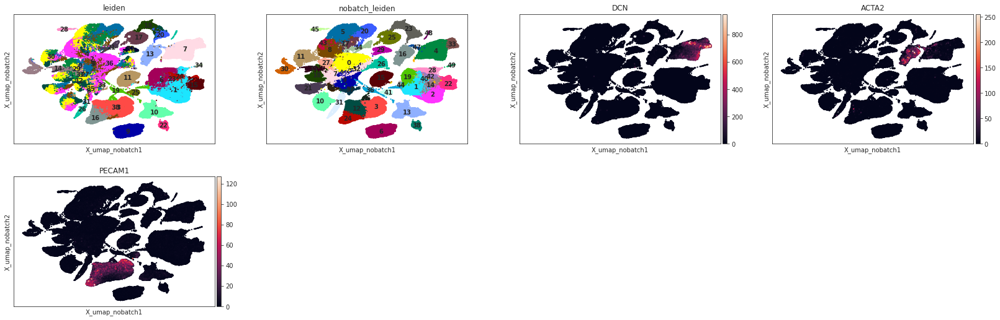

In [6]:
sc.pl.embedding(adata, basis='X_umap_nobatch', color=['leiden', 'nobatch_leiden', 'DCN', 'ACTA2', 'PECAM1'], legend_loc='on data', size=20)

## Extract the fibroblasts

In [7]:
adata = adata[adata.obs.leiden.isin(["7"])]

In [ ]:
A = sc.AnnData(adata.X, var=adata.var, obs=adata.obs)
A.raw = A
del adata
gc.collect()
A = pipeline.michi_kallisto_recipe(A,  harmony_correction='samplename', harmony_clusters=None)
pipeline.differential_expression_michi_kallisto_recipe(A, 'leiden')

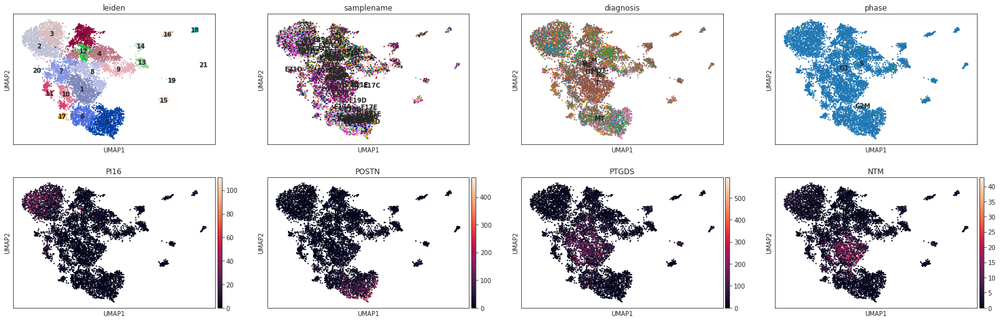

In [9]:
sc.pl.umap(A, color=['leiden', 'samplename', 'diagnosis', 'phase', 'PI16','POSTN','PTGDS', 'NTM'], legend_loc='on data', size=20)

In [10]:
# A.write_h5ad('/home/mstrasse/TB4/cellTypeProportions/fibro_processed.h5ad')

# Analysis

In [14]:
mkdir /tmp/proportions

In [15]:
plotfolder = '/tmp/proportions/Fibroblast_proportions/'
import os 
if not os.path.exists(plotfolder):
    os.mkdir(plotfolder)

In [ ]:
A = sc.read_h5ad('/home/mstrasse/TB4/cellTypeProportions/fibro_processed.h5ad')

## Preprocess/Filter

In [3]:
# fixing some diagnosis
A = fix_diagnosis(A)
A.obs.diagnosis = pd.Categorical(A.obs.diagnosis)
recolor(A, 'diagnosis', color_dict_diagnosis)

In [4]:
df_meta = read_metadata()

# again fix diagnosis in those samples
df_meta = df_meta[df_meta.samplename.isin(A.obs.samplename.unique())].set_index('samplename').sort_values('diagnosis')
for s, d in diagnosis_fix_dict.items():
    df_meta.loc[s, 'diagnosis'] = d

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'sample_diagnosis' as categorical


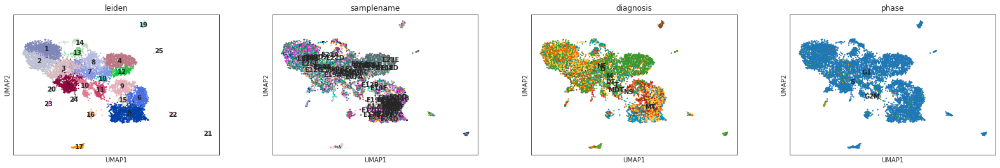

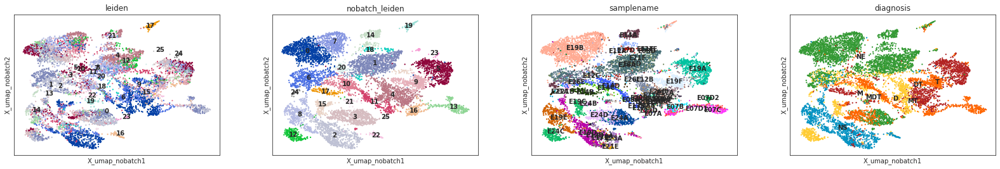

In [7]:
sc.pl.umap(A, color=['leiden', 'samplename', 'diagnosis', 'phase'], legend_loc='on data', size=20)
sc.pl.embedding(A, basis="X_umap_nobatch", color=['leiden', 'nobatch_leiden', 'samplename', 'diagnosis'], legend_loc='on data', size=20)

filtering away the minor clusters, probably doublets

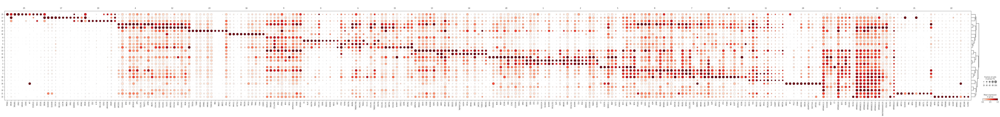

In [8]:
sc.pl.rank_genes_groups_dotplot(A, standard_scale='var', n_genes=10)

In [9]:
doublets = ['25','17','19', '21', '22']

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


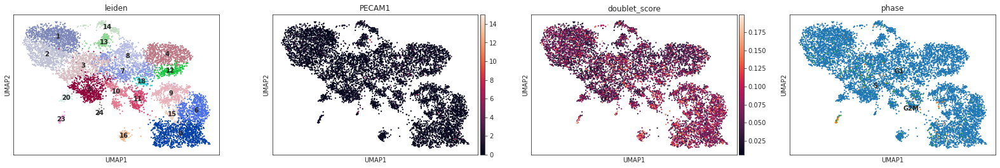

In [10]:
A = A[~A.obs.leiden.isin(doublets)]
sc.pl.umap(A, color=['leiden', 'PECAM1', 'doublet_score', 'phase'], legend_loc='on data', size=20)

In [11]:
# remove the non-pure diagnoses
A = A[A.obs.diagnosis.isin(['NE', 'NS', 'M','D','T'])]

# remove proliferating cells
A = A[~A.obs.leiden.isin(['23'])]

in case we want to reprocess:

In [12]:
# A = sc.AnnData(A.raw.X, var=A.raw.var, obs=A.obs)
# A.raw = A
# gc.collect()
# A = pipeline.michi_kallisto_recipe(A,  harmony_correction='samplename', harmony_clusters=None)
# pipeline.differential_expression_michi_kallisto_recipe(A, 'leiden')
# sc.pl.umap(A, color=['leiden'], legend_loc='on data', size=20)
# sc.pl.rank_genes_groups_dotplot(A, standard_scale='var', swap_axes=True, n_genes=10)

### Recluster coarser

Trying to set attribute `.obs` of view, copying.
11/27/2022 12:01:35 AM doing csr->csc
11/27/2022 12:01:35 AM done csr->csc
11/27/2022 12:01:52 AM doing csc->csr
11/27/2022 12:01:53 AM done csc->csr
11/27/2022 12:01:53 AM Filtering DE
11/27/2022 12:01:54 AM Done Filtering DE


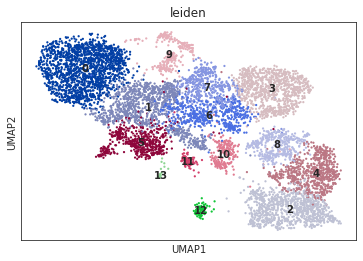

In [13]:
if 'leiden_backup' not in A.obs.columns:
    A.obs['leiden_backup'] = A.obs.leiden
sc.tl.leiden(A, resolution=0.6)
# sc.tl.leiden(A, resolution=0.5)
pipeline.differential_expression_michi_kallisto_recipe(A, groupby='leiden')
sc.pl.umap(A, color=['leiden'], legend_loc='on data', size=20)

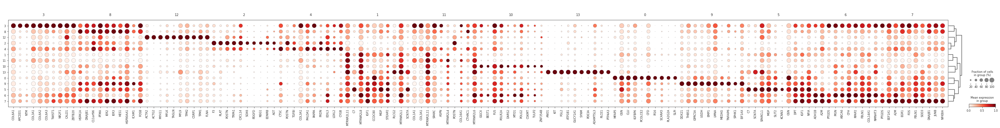

In [26]:
sc.tl.dendrogram(A, 'leiden')
sc.pl.rank_genes_groups_dotplot(A, standard_scale='var')

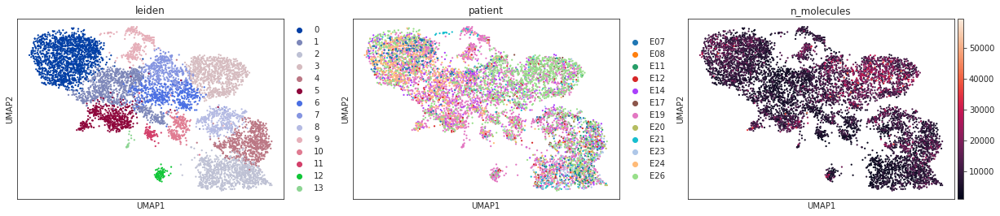

In [14]:
sc.pl.umap(A, color=['leiden', 'patient', 'n_molecules'], size=20)
# sc.pl.embedding(A, basis='X_umap_nobatch', color=['leiden', 'patient', 'n_molecules'], size=20)

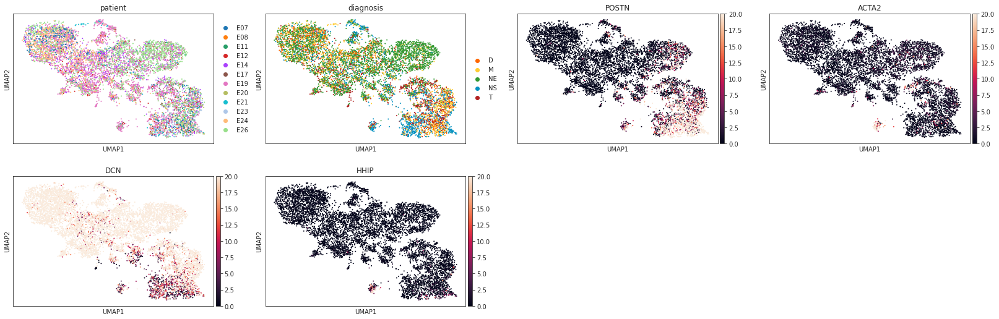

In [15]:
sc.pl.umap(A, color=['patient', 'diagnosis','POSTN', 'ACTA2', 'DCN','HHIP'], vmax=20)

# SCCODA

In [2]:
A = sc.read_h5ad('/home/mstrasse/TB4/cellTypeProportions/scCODA_ready/fibro_processed.h5ad')

In [5]:
data_scanpy_1 = dat.from_scanpy(
    A,
    cell_type_identifier="leiden",
    sample_identifier="samplename",
    covariate_df=df_meta[df_meta.index.isin(A.obs.samplename.unique())]
)
print(data_scanpy_1)

AnnData object with n_obs × n_vars = 49 × 14
    obs: 'foldername', 'patient', 'sequencer', 'tissue', 'flowcell', 'procedure', 'diagnosis', 'treatment', 'phantompurger_folder', 'cruk_sample', 'atlas_sample', 'R2length', 'gender'
    var: 'n_cells'


In [6]:
# cluster_order = ['2', '1','4','9', '5','0'] 
# cluster_order = ['1', '3','4','5', '2'] 
cluster_order = ['3','2','4','8','0']

cluster_order = cluster_order + [i for i in data_scanpy_1.var.index if i not in cluster_order]

changin the colormap to reflect the different fibroblast subpopulations

In [7]:
from crukiopy_release.colormaps import cmap_subtypes, ListedColormap

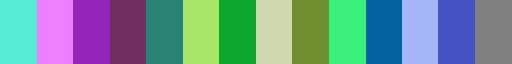

In [8]:
#move some colors around, so that the NS sepcific Fibs get the same hue
#  NE spec        # NS            # Pan            # rest
cm_colors = cmap_subtypes.colors
cmap_subtypes = ListedColormap(cm_colors[0:1] + cm_colors[10:13] + cm_colors[1:2] + cm_colors[2:7] + cm_colors[7:10] +cm_colors[13:])
cmap_subtypes

In [9]:
diagnosis_ordered = ['NE', 'M','D','T', 'NS']

In [10]:
# # note: need to write the full 35k genes! .to_adata() neatly pulls that out of .raw and applies any other attributes from teh original adata
# B = A.raw.to_adata()
# B.uns = A.uns
# B.obsm = A.obsm
# B.obsp= A.obsp
# B.write_h5ad('/home/mstrasse/TB4/cellTypeProportions/scCODA_ready/fibro_processed.h5ad')

In [10]:
B = sc.read_h5ad('/home/mstrasse/TB4/cellTypeProportions/scCODA_ready/fibro_processed.h5ad')

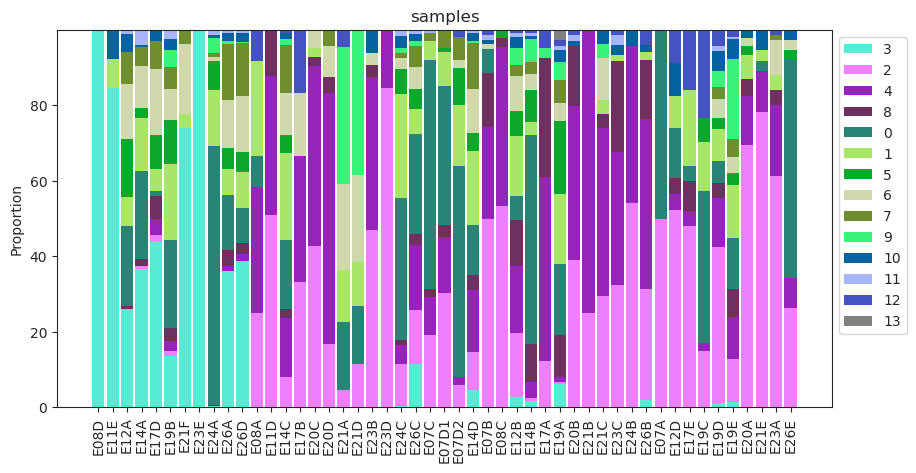

In [16]:
order = []
_s = data_scanpy_1.obs.index
for d in diagnosis_ordered:
    order.extend(sorted(df_meta.query('diagnosis==@d and samplename in @_s').index))

set_matplotlib_formats('svg')
fig = viz.stacked_barplot(data_scanpy_1[:, cluster_order], feature_name="samples", 
                          figsize=(10,5), level_order=order, cmap=cmap_subtypes)
plt.xticks(rotation=90);
fig.figure.savefig(f'{plotfolder}/Fibroblast_proportions_per_sample.svg')
set_matplotlib_formats('png')

In [19]:
leiden_color_dict = dict(zip(cluster_order, cmap_subtypes.colors ))
_tmp = [leiden_color_dict[c] for c in A.obs.leiden.cat.categories]

if not 'leiden_colors_backup' in A.uns:
    A.uns['leiden_colors_backup']= A.uns['leiden_colors']
A.uns['leiden_colors'] = _tmp

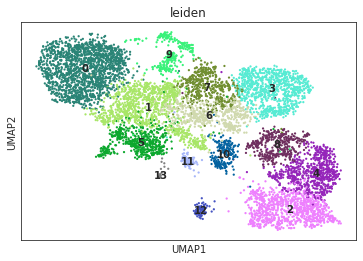

In [21]:
set_matplotlib_formats('png')
sc.pl.umap(A, color=['leiden'], legend_loc='on data', size=20, show=False)
plt.savefig(f'{plotfolder}/Fibroblast_umap.svg')
plt.savefig(f'{plotfolder}/Fibroblast_umap.png')
set_matplotlib_formats('png')

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


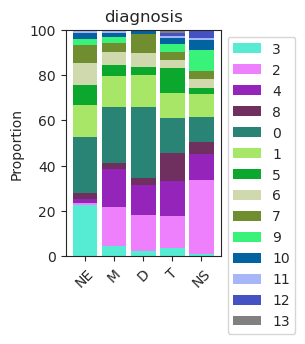

In [22]:
set_matplotlib_formats('svg')
fig = viz.stacked_barplot(data_scanpy_1[:, cluster_order], feature_name="diagnosis", level_order=diagnosis_ordered, cmap=cmap_subtypes, figsize=(2,3) )
fig.figure.savefig(f'{plotfolder}/Fibroblast_proportions_per_diagnosis.svg')
set_matplotlib_formats('png')

In [47]:
set_matplotlib_formats('png')

In [23]:
q = pd.crosstab(
    pd.Series(pd.Categorical(A.obs.leiden, categories=cluster_order), name='leiden', index=A.obs.leiden.index),
    A.obs.diagnosis
)
norm_freqs = q.div( q.sum(1), axis=0)
norm_freqs = norm_freqs.unstack().reset_index().rename({0:'frequency'}, axis=1)

In [24]:
norm_freqs.diagnosis = pd.Categorical(norm_freqs.diagnosis, categories=diagnosis_ordered)

/home/mstrasse/miniconda3/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 3 x 2 in image.
/home/mstrasse/miniconda3/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /tmp/proportions/Fibroblast_proportions//Fibroblast_proportions_per_cluster.svg


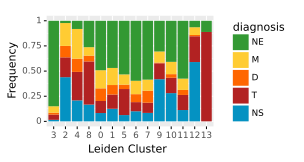

<ggplot: (8732067231617)>

In [25]:
set_matplotlib_formats('svg')
p = pn.ggplot(
    norm_freqs,
    pn.aes(x='leiden', y='frequency', fill='diagnosis')) + pn.geom_bar(stat='identity') \
+ pn.theme(figure_size=(3,2)) + pn.scale_fill_manual(color_dict_diagnosis) + pn.labs(x='Leiden Cluster', y='Frequency')
p.save(f'{plotfolder}/Fibroblast_proportions_per_cluster.svg')
p

In [49]:
set_matplotlib_formats('png')

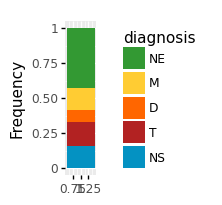

<ggplot: (8764862020501)>

In [102]:
overall_props = A.obs.diagnosis.value_counts()
overall_props = overall_props/overall_props.sum()
overall_props = overall_props.loc[diagnosis_ordered]

_ddd = pd.DataFrame(overall_props).reset_index().rename({'index': 'diagnosis','diagnosis': 'frequency'}, axis=1)
_ddd.diagnosis = pd.Categorical(_ddd.diagnosis, categories=diagnosis_ordered)

pn.ggplot(
    _ddd,
    pn.aes(x=1, y='frequency', fill='diagnosis')) + pn.geom_bar(stat='identity') \
+ pn.theme(figure_size=(7,2)) + pn.scale_fill_manual(color_dict_diagnosis) + pn.theme(figure_size=(0.4,2)) + pn.labs(x='', y='Frequency')

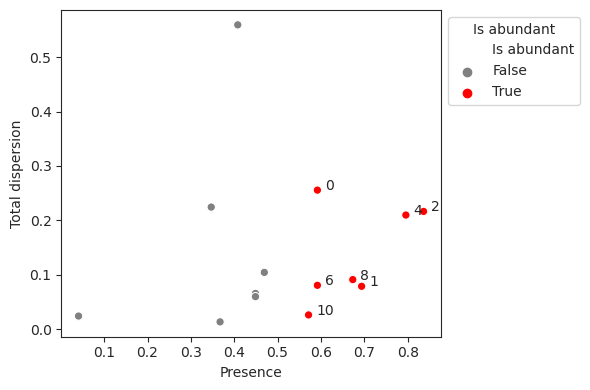

In [51]:
viz.rel_abundance_dispersion_plot(
    data=data_scanpy_1,
    abundant_threshold=0.5
)
plt.show()

In [53]:
model_salm = mod.CompositionalAnalysis(data_scanpy_1, formula="C(diagnosis, Treatment('NE')) + procedure + patient", reference_cell_type="1")
# Run MCMC
sim_results = model_salm.sample_hmc(num_results=3*20000)

100%|██████████| 60000/60000 [08:56<00:00, 111.81it/s]


MCMC sampling finished. (584.296 sec)
Acceptance rate: 46.1%


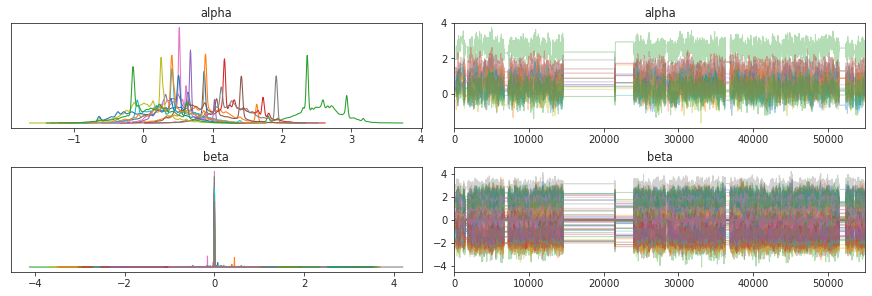

In [109]:
import arviz as az

az.plot_trace(
    sim_results,
    divergences=False,
    var_names=["alpha", "beta"],
    coords={"cell_type": sim_results.posterior.coords["cell_type_nb"]},
)
plt.show()

In [55]:
scCODA_result = sim_results.effect_df
scCODA_result[sim_results.effect_df['Final Parameter'] != 0]

Final Parameter  HDI 3%  \
Covariate                           Cell Type                            
C(diagnosis, Treatment('NE'))[T.D]  0                 0.728641  -0.007   
                                    2                 1.793729   0.832   
                                    3                -1.900595  -2.785   
                                    4                 1.503146   0.587   
C(diagnosis, Treatment('NE'))[T.M]  2                 1.816902   1.222   
                                    3                -1.996097  -2.780   
                                    4                 1.610925   0.977   
C(diagnosis, Treatment('NE'))[T.NS] 2                 2.769759   2.023   
                                    3                -1.876112  -2.573   
                                    4                 1.209962   0.549   
                                    12                0.953213   0.187   
C(diagnosis, Treatment('NE'))[T.T]  0                -0.680443  -1.215   
                                    2                 1.976298   1.305   
                                    3                -1.820231  -2.432   
                                    4                 2.052156   1.459   
                                    8                 1.273314   0.738   
procedure[T.resection]              0                 1.053520   0.390   
                                    2                -1.838603  -2.434   
                                    3                -1.005344  -1.632   
                                    4                -2.011896  -2.495   
                                    8                -1.431456  -2.018   
                                    11               -0.786983  -1.428   
                                    12               -1.090926  -1.761   
                                    13               -1.051076  -1.720   
gender[T.M]                         2                 0.471782  -0.022   

                                               HDI 97%     SD  \
Covariate                           Cell Type                   
C(diagnosis, Treatment('NE'))[T.D]  0            1.286  0.418   
                                    2            2.722  0.516   
                                    3           -0.907  0.528   
                                    4            2.433  0.511   
C(diagnosis, Treatment('NE'))[T.M]  2            2.437  0.323   
                                    3           -1.343  0.409   
                                    4            2.231  0.333   
C(diagnosis, Treatment('NE'))[T.NS] 2            3.319  0.350   
                                    3           -1.185  0.362   
                                    4            1.922  0.407   
                                    12           1.684  0.443   
C(diagnosis, Treatment('NE'))[T.T]  0            0.001  0.412   
                                    2            2.577  0.345   
                                    3           -1.113  0.354   
                                    4            2.678  0.320   
                                    8            1.765  0.284   
procedure[T.resection]              0            1.671  0.399   
                                    2           -1.402  0.292   
                                    3           -0.449  0.342   
                                    4           -1.486  0.269   
                                    8           -0.900  0.307   
                                    11           0.011  0.467   
                                    12          -0.453  0.365   
                                    13          -0.354  0.474   
gender[T.M]                         2            0.840  0.250   

                                               Inclusion probability  \
Covariate                           Cell Type                          
C(diagnosis, Treatment('NE'))[T.D]  0                       0.798818   
                                    2                       0.999655   
    

In [56]:
_q = scCODA_result.reset_index()
a = pd.crosstab(_q['Covariate'].replace({
    "C(diagnosis, Treatment('NE'))[T.D]": 'D',
    "C(diagnosis, Treatment('NE'))[T.M]": 'M',
    "C(diagnosis, Treatment('NE'))[T.T]": 'T',
    "C(diagnosis, Treatment('NE'))[T.NS]": 'NS',
    "procedure[T.resection]": 'resection'
    }),
    _q['Cell Type'], 
    values=_q['log2-fold change']* (_q['Final Parameter'] !=0), aggfunc=np.mean).replace({np.nan: 0})

Text(6.0, 0.5, '')

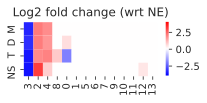

In [67]:
set_matplotlib_formats('svg')
fig, ax = plt.subplots(figsize=(3, 1)) # Width, height in inches.
sns.heatmap(a.loc[['M','D','T','NS'], cluster_order], cmap=plt.cm.bwr, vmin=-4, vmax=4, xticklabels=True)
plt.title('Log2 fold change (wrt NE)')
plt.xlabel(None)
plt.ylabel(None)

In [ ]:
fig.savefig(f'{plotfolder}/Fibroblasts_scCODA.svg')

In [68]:
set_matplotlib_formats('png')

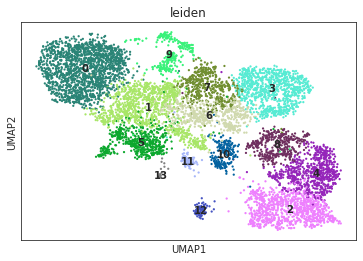

In [66]:
sc.pl.umap(A, color=['leiden'], legend_loc='on data', size=20)

# Markers for paper

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


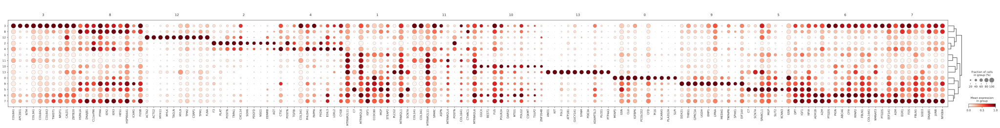

In [26]:
sc.tl.dendrogram(A, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(A, standard_scale='var')

In [27]:
sc.pl.umap(A, color=['leiden', 'n_genes','n_molecules', 'percent_mito'], legend_loc='on data', size=20)

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


{'mainplot_ax': <AxesSubplot:>,
 'color_legend_ax': <AxesSubplot:title={'center':'Mean expression\nin group'}>}

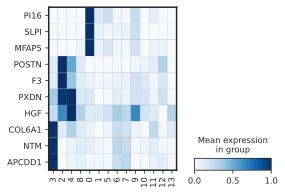

In [43]:
genes =['PI16','SLPI','MFAP5',
        'POSTN', 'F3','PXDN','HGF',
        'COL6A1','NTM', 'APCDD1']

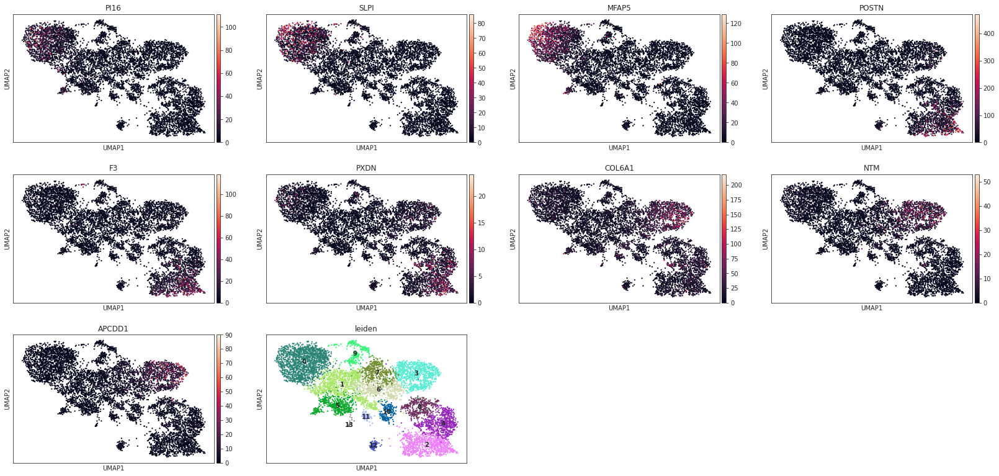

/home/mstrasse/miniconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


In [ ]:
genes =['PI16','SLPI','MFAP5',
        'POSTN', 'F3','PXDN',
        'COL6A1','NTM', 'APCDD1']
set_matplotlib_formats('png')
sc.pl.umap(A, color=genes+['leiden'], legend_loc='on data', size=20)

B = A.copy()
B.obs['leiden'] = pd.Categorical(B.obs['leiden'], categories=cluster_order)
set_matplotlib_formats('svg')
sc.pl.stacked_violin(B, var_names=genes, groupby='leiden', standard_scale='var', swap_axes=True, show=False, #order=cluster_order
                figsize=(4,3))
plt.savefig(f'{plotfolder}/Fibroblast_markers.svg')

sc.pl.stacked_violin(B, var_names=genes, groupby='leiden', standard_scale='var', swap_axes=True, use_raw=False,  #order=cluster_order
                figsize=(4,3))
plt.xticks(rotation=90);


sc.pl.matrixplot(B, var_names=genes, groupby='leiden', standard_scale='var', swap_axes=True, show=False, use_raw=True, #order=cluster_order
                figsize=(4,3), cmap='Blues')
plt.savefig(f'{plotfolder}/Fibroblast_markers_matrix.svg')
